# 1. Installation of detectron2

In [2]:
!pip install pyyaml==5.1

In [3]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [7]:
from matplotlib import pyplot as plt

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# 2. Basic image check

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


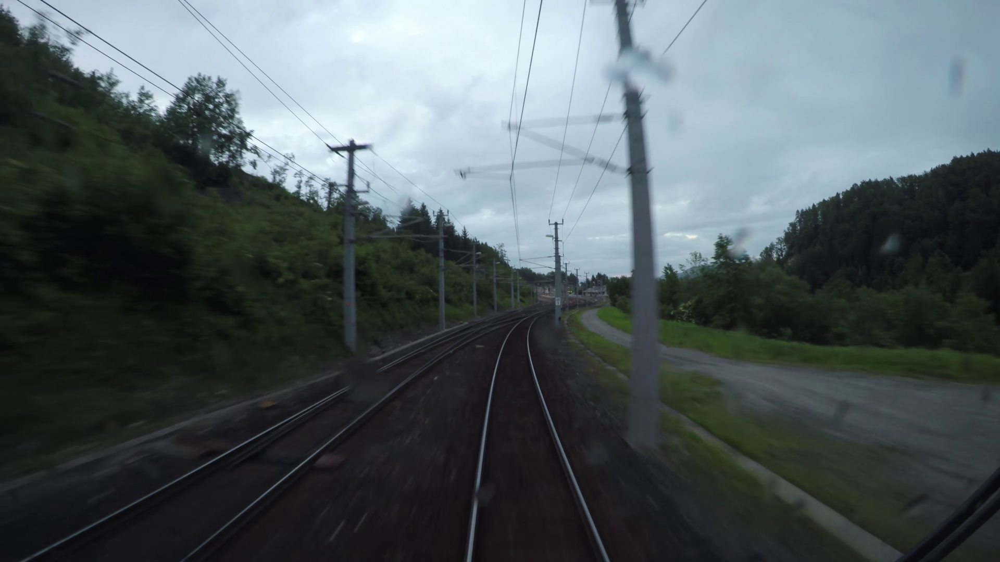

In [8]:
im = cv2.imread("/content/drive/MyDrive/OTIV_challenge/test_dataset/train/rs00000.jpg")
cv2_imshow(im)

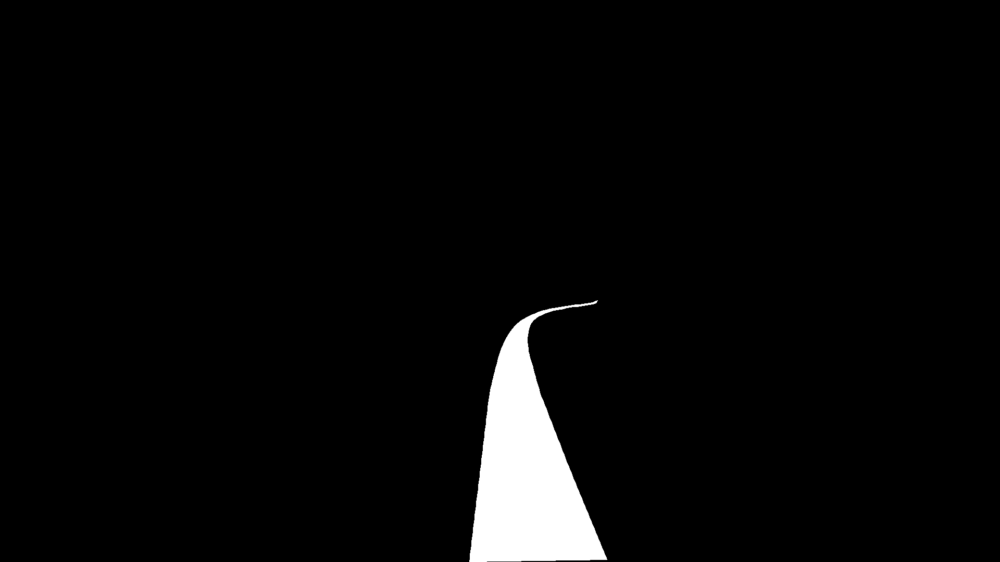

In [9]:
im_mask = cv2.imread("/content/drive/MyDrive/OTIV_challenge/test_dataset/train_mask/rs00000.png")
cv2_imshow(im_mask)

# 3. Dataset preparation

### Step 1: Transformation to COCO dataset

#### 1.1 From png masks to coco style json annotations

See [dataset_conversion.ipynb](/home/ubuntu/otiv_ml_challenge/dataset_conversion.ipynb), this notebook peforms the conversion and saves the new dataset

#### 1.2 Filter to only include rail annotations

See [coco_filtering.ipynb](/home/ubuntu/otiv_ml_challenge/coco_filtering.ipynb), this notebook filters the COCO dataset to only include rail masks

#### 1.3 Test to see if the transformation to COCO worked:

See [inspect_coco.ipynb](/home/ubuntu/otiv_ml_challenge/inspect_coco.ipynb), this notebook generates annotated images from the COCO json annotations

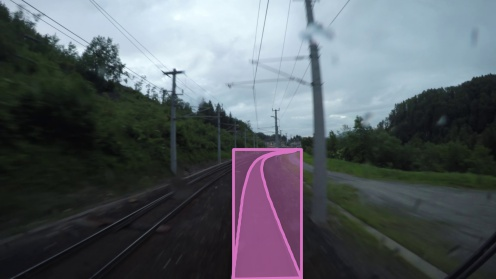

In [10]:
im_mask = cv2.imread("/content/drive/MyDrive/OTIV_challenge/0_annotated.jpg")
cv2_imshow(im_mask)

### Step 2: Register the COCO datasets to detectron2

In [11]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("rails_test_train", {}, "/content/drive/MyDrive/OTIV_challenge/test_dataset_COCO/train_filtered.json", "/content/drive/MyDrive/OTIV_challenge/test_dataset/train")
register_coco_instances("rails_test_val", {}, "/content/drive/MyDrive/OTIV_challenge/test_dataset_COCO/val_filtered.json", "/content/drive/MyDrive/OTIV_challenge/test_dataset/val")


### Step 3: Fix amount of classes error

In [ ]:
#from detectron2.data import MetadataCatalog
#my_classes = MetadataCatalog.get("rails_test_val").thing_classes = ['rail',]
#my_classes = MetadataCatalog.get("rails_test_train").thing_classes
#print("Classes:", my_classes)
#print("Amount of classes:", len(my_classes))

# 4. Training

In [12]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("rails_test_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/20 11:27:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:03, 54.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[02/20 11:28:03 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/20 11:28:14 d2.utils.events]:  eta: 0:02:19  iter: 19  total_loss: 1.58  loss_cls: 0.6103  loss_box_reg: 0.1425  loss_mask: 0.6931  loss_rpn_cls: 0.1107  loss_rpn_loc: 0.00682  time: 0.5019  data_time: 0.0524  lr: 1.6068e-05  max_mem: 2672M
[02/20 11:28:24 d2.utils.events]:  eta: 0:02:08  iter: 39  total_loss: 1.441  loss_cls: 0.4715  loss_box_reg: 0.1434  loss_mask: 0.6838  loss_rpn_cls: 0.09343  loss_rpn_loc: 0.006258  time: 0.4900  data_time: 0.0072  lr: 3.2718e-05  max_mem: 2672M
[02/20 11:28:33 d2.utils.events]:  eta: 0:01:58  iter: 59  total_loss: 1.387  loss_cls: 0.3418  loss_box_reg: 0.3008  loss_mask: 0.6578  loss_rpn_cls: 0.07182  loss_rpn_loc: 0.005534  time: 0.4862  data_time: 0.0068  lr: 4.9367e-05  max_mem: 2672M
[02/20 11:28:43 d2.utils.events]:  eta: 0:01:48  iter: 79  total_loss: 1.428  loss_cls: 0.3362  loss_box_reg: 0.4574  loss_mask: 0.5867  loss_rpn_cls: 0.04655  loss_rpn_loc: 0.005214  time: 0.4854  data_time: 0.0072  lr: 6.6017e-05  max_mem: 2672M
[02/20 11:2

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

# 5. Inference

In [14]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


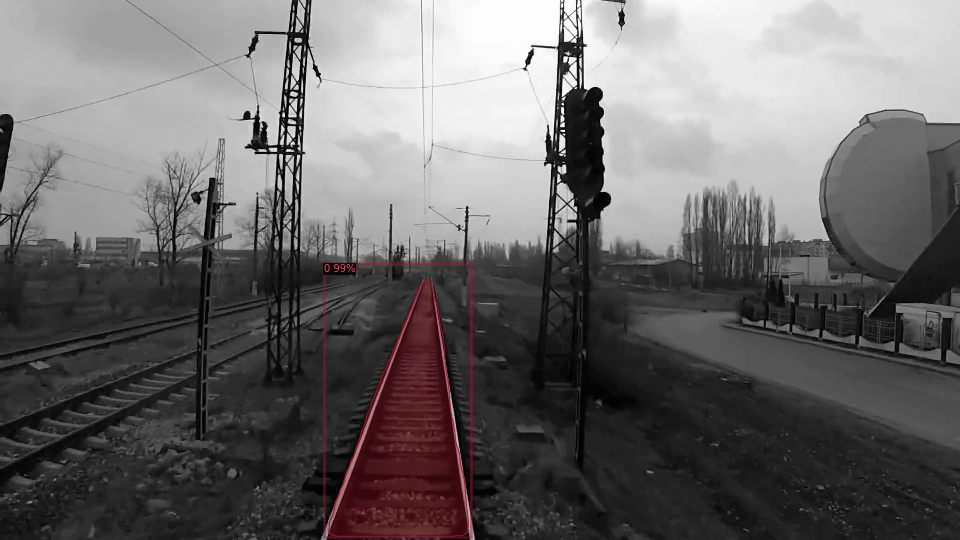

In [17]:
from detectron2.utils.visualizer import ColorMode   
im = cv2.imread('/content/drive/MyDrive/OTIV_challenge/test_dataset/val/rs00005.jpg')
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
               scale=0.5, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


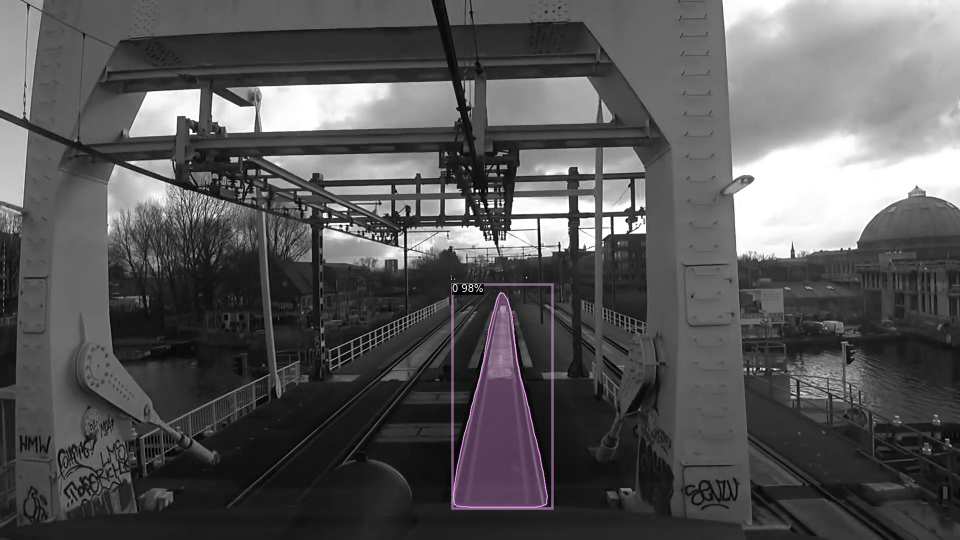

In [21]:
from detectron2.utils.visualizer import ColorMode   
im = cv2.imread('/content/drive/MyDrive/OTIV_challenge/rail_segmentation/train/rs00656.jpg')
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
               scale=0.5, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("rails_test_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "rails_test_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[02/20 11:44:16 d2.data.datasets.coco]: Loaded 2 images in COCO format from /content/drive/MyDrive/OTIV_challenge/test_dataset_COCO/val_filtered.json
[02/20 11:44:16 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    rail    | 2            |
|            |              |
[02/20 11:44:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/20 11:44:16 d2.data.common]: Serializing 2 elements to byte tensors and concatenating them all ...
[02/20 11:44:16 d2.data.common]: Serialized dataset takes 0.00 MiB
[02/20 11:44:16 d2.evaluation.evaluator]: Start inference on 2 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[02/20 11:44:17 d2.evaluation.evaluator]: Total inference time: 0:00:00.206340 (0.206340 s / iter per device, on 1 devices)
[02/20 11:44:17 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.129634 s / iter per device, on 1 devices)
[02/20 11:44:17 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/20 11:44:17 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[02/20 11:44:17 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[02/20 11:44:17 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[02/20 11:44:17 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[02/20 11:44:17 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[02/20 11:44:17 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP)